In [82]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator
from scipy.signal import lfilter
import numpy as np
import pandas as pd
import statistics
import math
import glob  # List the content of the current working directory
#%matplotlib qt #display in another window

In [83]:
class color: # Color class to customize your 'print()' functions
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

def get_super(x):
    normal = "ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789+-=()"
    super_s = "ᴬᴮᶜᴰᴱᶠᴳᴴᴵᴶᴷᴸᴹᴺᴼᴾQᴿˢᵀᵁⱽᵂˣʸᶻᵃᵇᶜᵈᵉᶠᵍʰᶦʲᵏˡᵐⁿᵒᵖ۹ʳˢᵗᵘᵛʷˣʸᶻ⁰¹²³⁴⁵⁶⁷⁸⁹⁺⁻⁼⁽⁾"
    res = x.maketrans(''.join(normal), ''.join(super_s))
    return x.translate(res)

def get_sub(x):
    normal = "ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz0123456789+-=()"
    sub_s = "ₐ₈CDₑբGₕᵢⱼₖₗₘₙₒₚQᵣₛₜᵤᵥwₓᵧZₐ♭꜀ᑯₑբ₉ₕᵢⱼₖₗₘₙₒₚ૧ᵣₛₜᵤᵥwₓᵧ₂₀₁₂₃₄₅₆₇₈₉₊₋₌₍₎"
    res = x.maketrans(''.join(normal), ''.join(sub_s))
    return x.translate(res)
    
## This part regroups all the 'def' functions used in the code. Change or add what you need. 

def Hardness_Plot_Format(): # Function that define the format of your plots
    plt.rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
    plt.gcf().set_dpi(1200)     # 300 minimum dpi for scientific figures, 
                               # 400 for figures with text
                               # save color figures as RGB format
    plt.rcParams.update({'axes.linewidth': 1}) # between 0.5 and 1 pt
    plt.rcParams.update({'font.size': 9}) # maximum font size for non-resized figures
     
    # x axis parmameter
    plt.xlim(0,4000)
    plt.tick_params(axis='x', direction='in', length=10, width=1, top=1, labelsize=10)
    plt.tick_params(axis='x', which='minor', direction='in', length=5, width=1, top=1)
    plt.gca().xaxis.set_minor_locator(AutoMinorLocator(5))
    plt.xlabel("Depth (nm)", fontsize=12)

    # y axis parmameter
    plt.ylim(0,8)
    plt.tick_params(axis='y', direction='in', length=10, width=1, right=1, labelsize=10)
    plt.tick_params(axis='y', which='minor', direction='in', length=5, width=1, right=1)
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator(2))
    plt.ylabel("Hardness, H (GPa)", fontsize=12)
    
def Modulus_Plot_Format(): # Function that define the format of your plots
    plt.rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
    plt.gcf().set_dpi(1200)     # 300 minimum dpi for scientific figures, 
                               # 400 for figures with text
                               # save color figures as RGB format
    plt.rcParams.update({'axes.linewidth': 1}) # between 0.5 and 1 pt
    plt.rcParams.update({'font.size': 9}) # maximum font size for non-resized figures
     
    # x axis parmameter
    plt.xlim(0,4000)
    plt.tick_params(axis='x', direction='in', length=10, width=1, top=1, labelsize=10)
    plt.tick_params(axis='x', which='minor', direction='in', length=5, width=1, top=1)
    plt.gca().xaxis.set_minor_locator(AutoMinorLocator(5))
    plt.xlabel("Depth (nm)", fontsize=12)

    # y axis parmameter
    plt.ylim(0,150)
    plt.tick_params(axis='y', direction='in', length=10, width=1, right=1, labelsize=10)
    plt.tick_params(axis='y', which='minor', direction='in', length=5, width=1, right=1)
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator(2))
    plt.ylabel("Modulus, E (GPa)", fontsize=12)

def CMAP_Hardness():
    plt.rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
    plt.gcf().set_dpi(1200)     # 300 minimum dpi for scientific figures, 
                               # 400 for figures with text
                               # save color figures as RGB format
    plt.rcParams.update({'axes.linewidth': 1}) # between 0.5 and 1 pt
    plt.rcParams.update({'font.size': 9}) # maximum font size for non-resized figures
     
    # x axis parmameter
    plt.tick_params(axis='x', direction='in', length=10, width=1, top=1, labelsize=10)
    plt.xlabel("Column")

    # y axis parmameter
    plt.tick_params(axis='y', direction='in', length=10, width=1, right=1, labelsize=10)
    plt.ylabel("Row")

    plt.colorbar(label='Hardness, H (GPa)')

def CMAP_Modulus():
    plt.rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
    plt.gcf().set_dpi(1200)     # 300 minimum dpi for scientific figures, 
                               # 400 for figures with text
                               # save color figures as RGB format
    plt.rcParams.update({'axes.linewidth': 1}) # between 0.5 and 1 pt
    plt.rcParams.update({'font.size': 9}) # maximum font size for non-resized figures
     
    # x axis parmameter
    plt.tick_params(axis='x', direction='in', length=10, width=1, top=1, labelsize=10)
    plt.xlabel("Column")

    # y axis parmameter
    plt.tick_params(axis='y', direction='in', length=10, width=1, right=1, labelsize=10)
    plt.ylabel("Row")

    plt.colorbar(label='Modulus, E (GPa)')

def CMAP_SRS():
    plt.rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
    plt.gcf().set_dpi(1200)     # 300 minimum dpi for scientific figures, 
                               # 400 for figures with text
                               # save color figures as RGB format
    plt.rcParams.update({'axes.linewidth': 1}) # between 0.5 and 1 pt
    plt.rcParams.update({'font.size': 9}) # maximum font size for non-resized figures
     
    # x axis parmameter
    plt.tick_params(axis='x', direction='in', length=10, width=1, top=1, labelsize=10)
    plt.xlabel("Column")

    # y axis parmameter
    plt.tick_params(axis='y', direction='in', length=10, width=1, right=1, labelsize=10)
    plt.ylabel("Row")

    plt.colorbar(label='Strain rate sensitivity, m')

def CMAP_Vact():
    plt.rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
    plt.gcf().set_dpi(1200)     # 300 minimum dpi for scientific figures, 
                               # 400 for figures with text
                               # save color figures as RGB format
    plt.rcParams.update({'axes.linewidth': 1}) # between 0.5 and 1 pt
     
    # x axis parmameter
    plt.tick_params(axis='x', direction='in', length=10, width=1, top=1, labelsize=10)
    plt.xlabel("Column")

    # y axis parmameter
    plt.tick_params(axis='y', direction='in', length=10, width=1, right=1, labelsize=10)
    plt.ylabel("Row")

    plt.colorbar(label='Activation volume, V{} '.format(get_sub('a')) + '(b{})'.format(get_super('3')))

def idx_max(liste):
    max = liste[0]
    a = 0 
    for i in range(len(liste)):
        if liste[i] > max:
            max  = liste [i]
            a = i
    return max, a 

def Average(lst):
    return sum(lst) / len(lst)

In [84]:
# Depth of the first jump (J1) as entered in the nanoindentation's method
J1 = 1500

# Strain rate (SR) used
SR1 = 1
SR2 = 0.01
SR_diff = abs(math.log(SR1) - math.log(SR2)) # Log difference between SR1 and SR2 for the SR sensitivity m calculation (SRS)

i = 1
x = 0
y = 0

Col, Row = 8, 6 # Number of columns (Col) and rows (Row). 
Nb_zones = Col * Row # Number of zones.
print('You have ',Nb_zones,' zones.') # Make sure you have the same number of zones indented as calculated here.

# Tables creation to stock hardness, modulus and activation volumes of each zones.
Hardness_Table = np.zeros((Row, Col))
Modulus_Table = np.zeros((Row,Col))
SRS_Table = np.zeros((Row,Col))
V_act_Table = np.zeros((Row,Col))

# Parameters for data filtering
n = 15  # the larger n is, the smoother curve will be
b = [1.0 / n] * n
a = 1

T = 295 # Temperature in Kelvin
Kb = 1.38*10**(-23) # Boltzman constant
Lattice_Param = 2.93*10**(-10) # Lattice parameter
Burgers_Vector = ((Lattice_Param*math.sqrt(3))/2)**3 # Burgers vector calculation for perfect dislocations. This is for BCC structure. 

You have  48  zones.


 
Z0.0_T1 
Average H(SR1) = 4.27 GPa
Average h(SR2) = 3.92 GPa
m = 0.018 
Vₐ = 16.48b³

Strain rate sensitivity m is 0.018390.
The activation volume is 16.482324b³. 
___________________________________________________________________ 
 
Z0.0_T2 
Average H(SR1) = 4.34 GPa
Average h(SR2) = 3.99 GPa
m = 0.018 
Vₐ = 16.35b³

Strain rate sensitivity m is 0.018252.
The activation volume is 16.416907b³. 
___________________________________________________________________ 
 
Z0.0_T3 
Average H(SR1) = 4.37 GPa
Average h(SR2) = 4.01 GPa
m = 0.018 
Vₐ = 16.19b³

Strain rate sensitivity m is 0.018305.
The activation volume is 16.341487b³. 
___________________________________________________________________ 
 
Z0.0_T4 
Average H(SR1) = 4.68 GPa
Average h(SR2) = 4.34 GPa
m = 0.016 
Vₐ = 15.52b³

Strain rate sensitivity m is 0.017833.
The activation volume is 16.136921b³. 
___________________________________________________________________ 
 
Z0.0_T5 
Average H(SR1) = 4.54 GPa
Average h(SR2) = 4.19 G

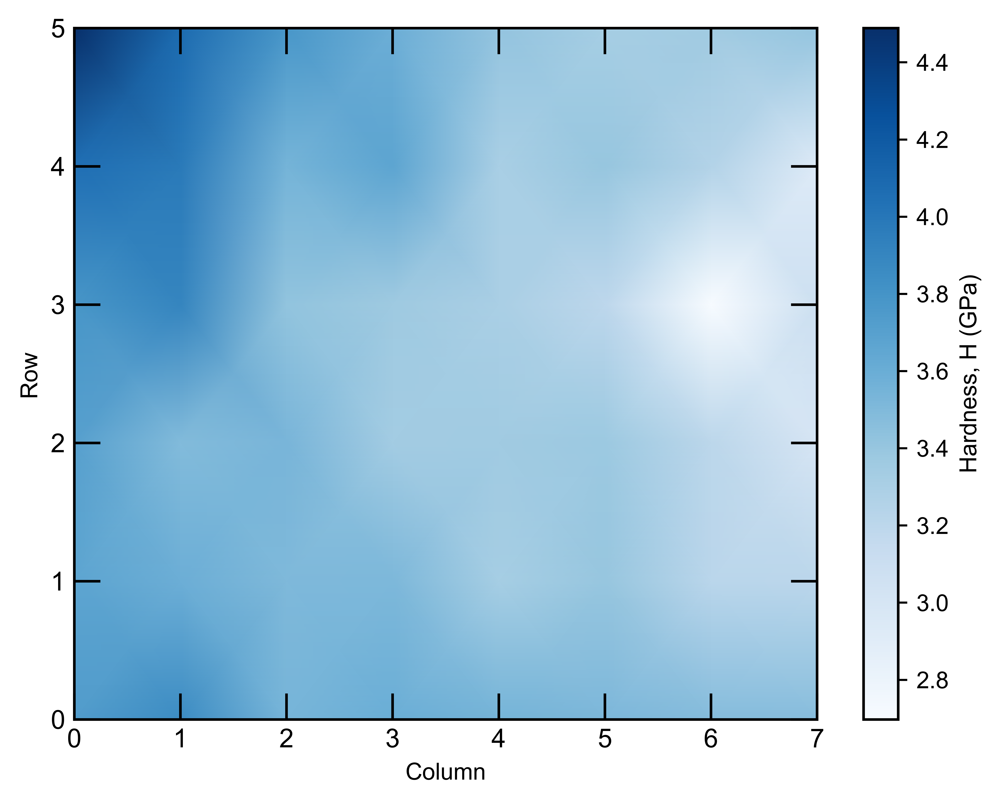

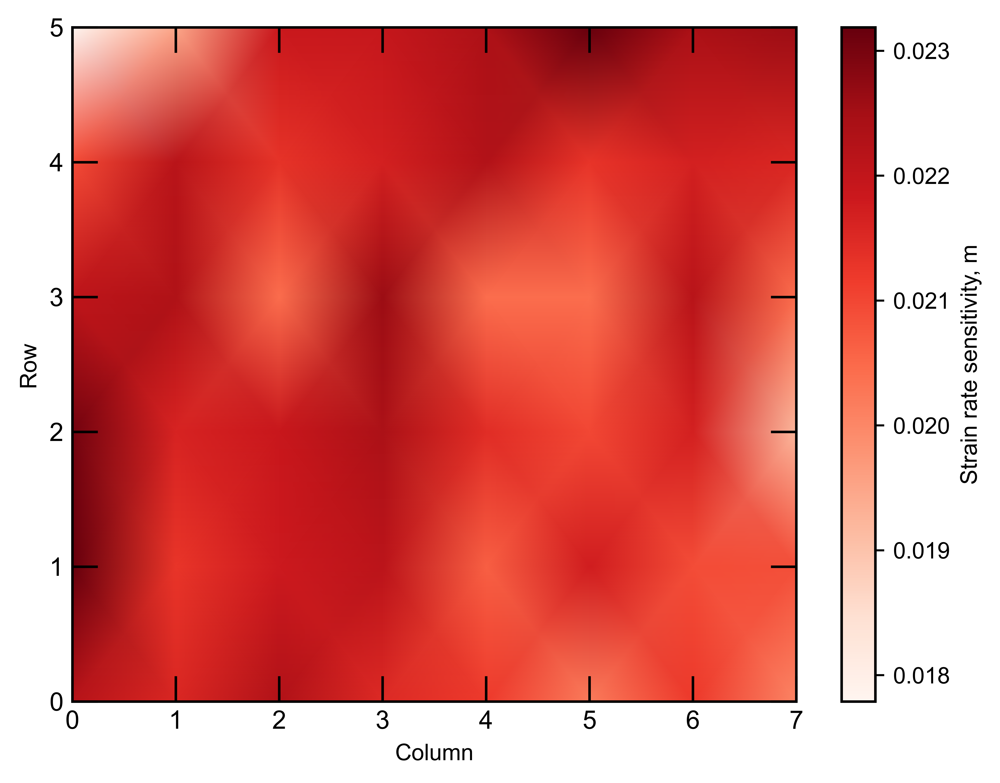

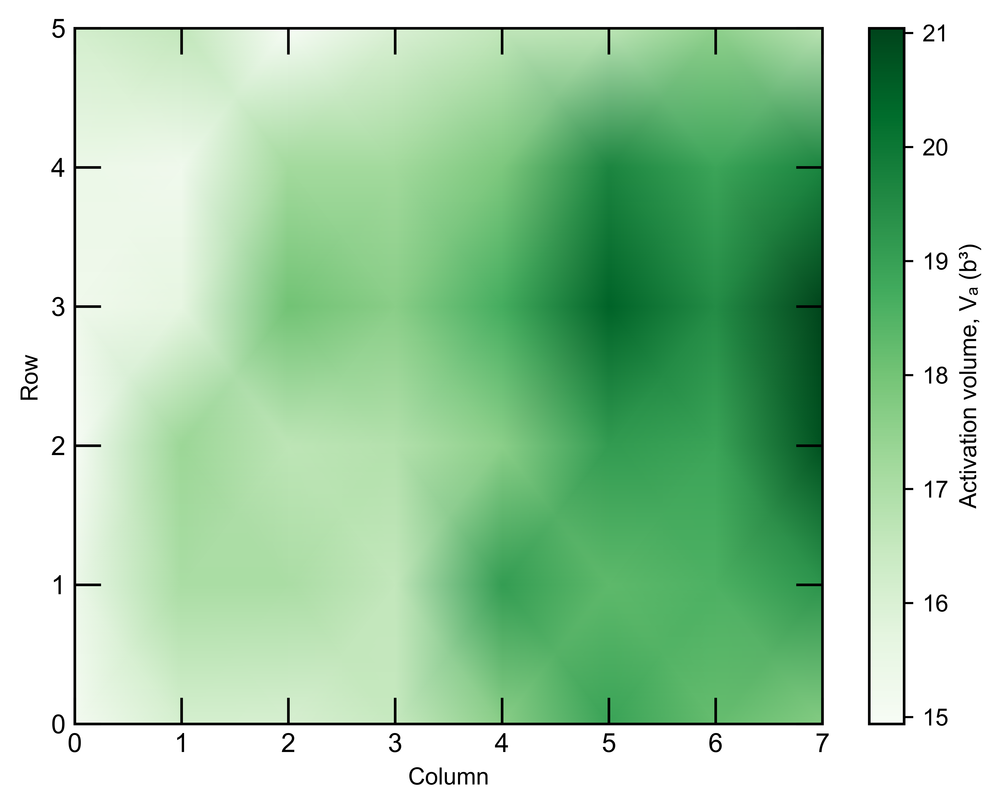

In [85]:
# Main script for data analysis.

for x in range (0,Row): # Row selection
    for y in range (0,Col): # Column selection
        m_Values = [] # Initialization of the Table for m values
        V_act_Values = [] # Initialization of the Table for Vact values
        while True: # Test selection
            # Initialization of the Tables needed for test averaging
            slope_Table = []
            k_idx = []
            k_idx_2 = []

            # Data importation and first filtration
            df = pd.read_csv('Z' + str(x) + '.' + str(y) + '_T' + str(i) + '.CSV')
            print(color.BOLD + color.RED,'\nZ' + str(x) + '.' + str(y) + '_T' + str(i),color.END)
            Tab = df.filter(items=['DEPTH','HARDNESS','MODULUS']) # Select only 'DEPTH', 'HARDNESS' and 'MODULUS' columns
            Tab = Tab.dropna(axis=0) # Delete all 'NaN' lines
            Tab = Tab.drop([0],axis=0) # Delete the first line (units line)
            Tab = Tab.astype(float) # Change the type category to 'float'
            TAB = np.array(Tab)

            # Data filtering process => smoothening/denoising of the signal
            Hardness_Filtered = lfilter(b, a, TAB[:,1])

            #plt.plot(TAB[:,0],TAB[:,1],'k-')
            #plt.plot(TAB[:,0],Hardness_Filtered,'g-')
            #plt.xlim(1000,3700)
            #plt.ylim(3,5)

            J1_min_1 = np.argmin(abs(TAB[:,0]-J1))
            TAB_idx_End = np.argmin(abs(TAB[:,0]-10000))
            #print('Index intervalle: from ',J1_min_1,'to ',TAB_idx_End)    

            for k in range (J1_min_1+100,TAB_idx_End-30):
                slope_10 = abs((Hardness_Filtered[k+30]-Hardness_Filtered[k])/(TAB[k+30,0]-TAB[k,0]))
                if slope_10>0.001:
                    slope_Table.append(slope_10)
                    k_idx.append(k)
                    #print(k_idx)
                    #plt.plot(TAB[k,0],Hardness_Filtered[k],'mx')
            j = 0
            while True:
                try:
                    diff_k_idx = k_idx[j+1]-k_idx[j]
                except IndexError:
                    break
                if diff_k_idx>50:
                    k_idx_2.append(k_idx[j])
                    k_idx_2.append(k_idx[j+1])
                    #plt.plot(k_idx_2,'bx')
                j = j + 1
            #print ('Index of each points of interest: ',k_idx_2)
            if len(k_idx_2) == 4:
                B2_idx = k_idx_2[0]
                B2 = B2_idx + 30
                B1 = B2 - 50
                A2 = B1 - 150
                C1 = k_idx_2[1]
                C2_idx = k_idx_2[2]
                C2 = C2_idx + 30
                D1 = k_idx_2[3]

                #plt.plot(TAB[A1,0],Hardness_Filtered[A1],'rx')
                #plt.plot(TAB[A2,0],Hardness_Filtered[A2],'b^')
                #plt.plot(TAB[B1,0],Hardness_Filtered[B1],'rx')
                #plt.plot(TAB[B2,0],Hardness_Filtered[B2],'b^')
                #plt.plot(TAB[C1,0],Hardness_Filtered[C1],'rx')
                #plt.plot(TAB[C2,0],Hardness_Filtered[C2],'b^')
                #plt.plot(TAB[D1,0],Hardness_Filtered[D1],'rx')
                #plt.show()

                Hardness_J1 = []
                Hardness_J2 = []
                Hardness_J3 = []

                for k in range(A2,B1):
                    Hardness_J1.append(Hardness_Filtered[k])
                    Hardness_Average_J1 = Average(Hardness_J1)
                for k in range(C2,D1):
                    Hardness_J3.append(Hardness_Filtered[k])
                    Hardness_Average_J3 = Average(Hardness_J3)
                    Hardness_Average_SR1 = abs((Hardness_Average_J1 + Hardness_Average_J3)/2)
                for k in range(B2,C1):
                    Hardness_J2.append(Hardness_Filtered[k])
                    Hardness_Average_SR2 = Average(Hardness_J2)
                H_diff1 = abs(math.log(Hardness_Average_J1) - math.log(Hardness_Average_SR2))
                H_diff2 = abs(math.log(Hardness_Average_SR2) - math.log(Hardness_Average_J3))

                m1 = abs((H_diff1)/(SR_diff))
                m2 = abs((H_diff2)/(SR_diff))
                m = (m1 + m2) / 2
                m_Values.append(m)
                m_Average = Average(m_Values)

                V_act = (3*math.sqrt(3)*T*Kb)/(m_Average*Hardness_Average_SR1*Burgers_Vector*10**(9))
                V_act_Values.append(V_act)
                V_act_Average = Average(V_act_Values)

                print('Average H(SR1) = {0:.2f}'.format(Hardness_Average_SR1),'GPa')
                print('Average h(SR2) = {0:.2f}'.format(Hardness_Average_SR2),'GPa')
                print('m = {0:.3f}'.format(m),'\nV{}'.format(get_sub('a')) + ' = {0:.2f}'.format(V_act) + 'b{}'.format(get_super('3')))
                print(color.BOLD + '\nStrain rate sensitivity m is {0:.6f}'.format(m_Average) + '.\nThe activation volume is {0:.6f}'.format(V_act_Average) + 'b{}.'.format(get_super('3')),color.END)
                print(color.BOLD + '___________________________________________________________________',color.END) 
            else:
                print('Data not used!')
                print(color.BOLD + '___________________________________________________________________',color.END) 
                pass 
            i = i + 1
            try: # Routine that checks if the next file exist. If not, generates an error message and prints the number of tests
                with open('C:/Users/Florent/Documents/Travail/UCSB/HTMDEC/BRC 603/B2/Low Res/Z' + str(x) + '.' + str(y) + '_T' + str(i)+ '.CSV'):pass
            except IOError:
                print('\nZ' + str(x) + '.' + str(y) + '_T' + str(i) + '.CSV not found!' + color.END,'\nEnd.')
                print(color.BOLD + '___________________________________________________________________',color.END) 
                break
        Hardness_Table[x,y] = Hardness_Average_SR1
        SRS_Table[x,y] = m_Average
        V_act_Table[x,y] = V_act_Average
        i = 1
        y = y + 1
        try: # Routine that checks if the next file exist. If not, generates an error message and prints the number of tests
            with open('C:/Users/Florent/Documents/Travail/UCSB/HTMDEC/BRC 603/B2/Low Res/Z' + str(x) + '.' + str(y) + '_T' + str(i)+ '.CSV'):pass
        except IOError:
            print('\nZ' + str(x) + '.' + str(y) + '_T' + str(i) + '.CSV not found!' + color.END,'\nEnd.')
            print(color.BOLD + '___________________________________________________________________',color.END) 
            break
    y = 0
    x = x + 1
    try: # Routine that checks if the next file exist. If not, generates an error message and prints the number of tests
        with open('C:/Users/Florent/Documents/Travail/UCSB/HTMDEC/BRC 603/B2/Low Res/Z' + str(x) + '.' + str(y) + '_T' + str(i)+ '.CSV'):pass
    except IOError:
        print('\nZ' + str(x) + '.' + str(y) + '_T' + str(i) + '.CSV not found!' + color.END,'\nEnd.')
        print(color.BOLD + '___________________________________________________________________',color.END) 
        break  

Hardness_Table = np.flipud(Hardness_Table)
plt.pcolormesh(Hardness_Table,shading='gouraud',cmap='Blues')
CMAP_Hardness()
plt.savefig('CMAP_Hardness.png', dpi=1200)
plt.show()

SRS_Table = np.flipud(SRS_Table)
plt.pcolormesh(SRS_Table,shading='gouraud',cmap='Reds')
CMAP_SRS()
plt.savefig('CMAP_SRS.png',dpi=1200)
plt.show()

V_act_Table = np.flipud(V_act_Table)
plt.pcolormesh(V_act_Table,shading='gouraud',cmap='Greens')
CMAP_Vact()
plt.savefig('CMAP_Vact.png',dpi=1200)
plt.show()